In [1]:
# import dependencies
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp
from MulticoreTSNE import MulticoreTSNE as TSNE

/home/daibaojun/.conda/envs/pyscenic/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/daibaojun/.conda/envs/pyscenic/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/daib

In [ ]:
# set variables for file paths to read from and write to:

# set a working directory
wdir = "./"
os.chdir( wdir )

# path to unfiltered loom file (this will be created in the optional steps below)
f_loom_path_unfilt = "tmem41b_unfiltered.loom" # test dataset, n=500 cells

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = "tmem41b_filtered_scenic.loom"

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "anndata.h5ad"

# path to pyscenic output
f_pyscenic_output = "pyscenic_output.loom"

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'tmem41b_scenic_integrated-output.loom'

In [3]:
sc.settings.verbosity = 1 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

-----
anndata     0.9.2
scanpy      1.9.8
-----
MulticoreTSNE       NA
PIL                 10.3.0
asttokens           NA
backcall            0.2.0
cffi                1.17.1
cloudpickle         3.1.0
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
cytoolz             1.0.1
dask                2023.5.0
dateutil            2.9.0.post0
debugpy             1.8.1
decorator           5.1.1
executing           2.0.1
h5py                3.11.0
importlib_resources NA
ipykernel           6.29.4
jedi                0.19.1
jinja2              3.1.5
joblib              1.4.0
kiwisolver          1.4.5
llvmlite            0.41.1
loompy              3.0.7
lz4                 4.3.3
markupsafe          2.1.5
matplotlib          3.7.5
mpl_toolkits        NA
natsort             8.4.0
numba               0.58.1
numexpr             2.8.6
numpy               1.24.4
numpy_groupies      0.9.22
packaging           24.0
pandas              2.0.3
parso               0.8.4
pexpect      

In [4]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 40

In [5]:
adata = sc.read_h5ad('../Myonuclei_subpopulation.h5ad')

In [7]:
row_attrs = { 
    "Gene": np.array(adata.var.index) ,
}
col_attrs = { 
    "CellID":  np.array(adata.obs.index) ,
    "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
}

lp.create( f_loom_path_unfilt, adata.X.transpose(), row_attrs, col_attrs )

## SCENIC steps

### STEP 1: Gene regulatory network inference, and generation of co-expression modules
#### Phase Ia: GRN inference using the GRNBoost2 algorithm

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system. We use the counts matrix (without log transformation or further processing) from the loom file we wrote earlier.
_Output:_ List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

In [ ]:
# transcription factors list
# f_tfs = "/ddn1/vol1/staging/leuven/stg_00002/lcb/cflerin/resources/allTFs_hg38.txt" # human
# f_tfs = "/ddn1/vol1/staging/leuven/stg_00002/lcb/cflerin/resources/allTFs_dmel.txt" # drosophila
f_tfs = "/TF_reference/allTFs_mm.txt"   # mouse

# tf_names = load_tf_names( f_tfs )

In [ ]:
!/arboreto_with_multiprocessing.py --num_worker 60 --sparse --method grnboost2 -o adj.csv {f_loom_path_scenic} {f_tfs}

/home/daibaojun/.conda/envs/pyscenic/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/daibaojun/.conda/envs/pyscenic/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/daib

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



 91%|█████████████████████████████   | 46027/50607 [25:18:02<2:59:29,  2.35s/it]

In [ ]:
# !/pyscenic grn {f_loom_path_scenic} {f_tfs} -o adj.csv --num_workers 40

read in the adjacencies matrix:

In [ ]:
adjacencies = pd.read_csv("/Scenic/adj.csv", index_col=False, sep='\t')

In [19]:
adjacencies.head()

,"TF,target,importance"
0,"Zfp217,Vwa1,20.805712391022148"
1,"Zfp971,Ankub1,20.40707123987021"
2,"Spz1,Ntrk2,20.18085729096734"
3,"Sft2d1,Gm12166,19.071633842431982"
4,"Pgam2,Ckm,18.326982694923892"


### STEP 2-3: Regulon prediction aka cisTarget from CLI

For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system.

_Output:_ List of adjacencies between a TF and its targets stored in `MOTIFS_FNAME`.

locations for ranking databases, and motif annotations:

In [ ]:
import glob
# ranking databases
f_db_glob = "/TF_analysis/TF_reference/*feather"
f_db_names = ' '.join( glob.glob(f_db_glob) )

# motif databases
f_motif_path = "/TF_analysis/TF_reference/motifs-v10nr_clust-nr.mgi-m0.001-o0.0.tbl"

Here, we use the `--mask_dropouts` option, which affects how the correlation between TF and target genes is calculated during module creation. It is important to note that prior to pySCENIC v0.9.18, the default behavior was to mask dropouts, while in v0.9.18 and later, the correlation is performed using the entire set of cells (including those with zero expression). When using the `modules_from_adjacencies` function directly in python instead of via the command line, the `rho_mask_dropouts` option can be used to control this.

In [ ]:
!/home/daibaojun/.conda/envs/pyscenic/bin/pyscenic ctx /DATA/User/daibaojun/TMEM41b/Scenic/adj.csv \
    {f_db_names} \
    --annotations_fname {f_motif_path} \
    --expression_mtx_fname {f_loom_path_scenic} \
    --output reg.csv \
    --mask_dropouts \
    --num_workers 40

### STEP 4: Cellular enrichment (aka AUCell) from CLI

It is important to check that most cells have a substantial fraction of expressed/detected genes in the calculation of the AUC.
The following histogram gives an idea of the distribution and allows selection of an appropriate threshold.
In this plot, a few thresholds are highlighted, with the number of genes selected shown in red text and the corresponding percentile in parentheses).
See [the relevant section in the R tutorial](https://bioconductor.org/packages/devel/bioc/vignettes/AUCell/inst/doc/AUCell.html#build-gene-expression-rankings-for-each-cell) for more information.

By using the default setting for `--auc_threshold` of `0.05`, we see that **1192** genes are selected for the rankings based on the plot below.

In [ ]:
nGenesDetectedPerCell = np.sum(adata.X>0, axis=1)
nGenesDetectedPerCell_array = np.array(nGenesDetectedPerCell).flatten()  
nGenesDetectedPerCell_series = pd.Series(nGenesDetectedPerCell_array) 
percentiles = nGenesDetectedPerCell_series.quantile([.01, .05, .10, .50, 1])
print(percentiles)

0.01     279.0
0.05     323.0
0.10     350.0
0.50     525.0
1.00    1345.0
dtype: float64


/tmp/ipykernel_3347572/251027262.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')


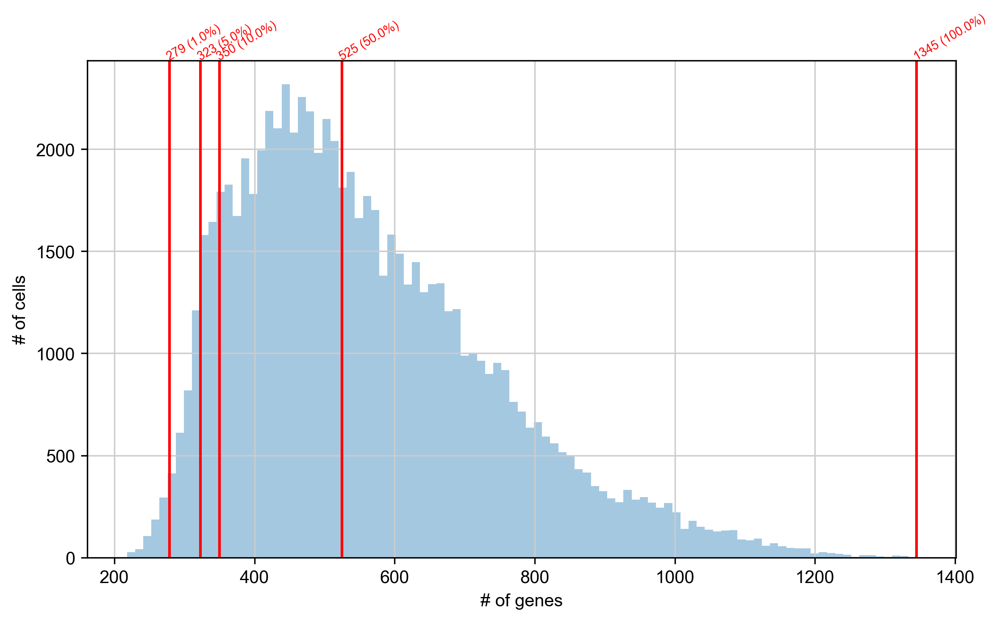

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i,x in enumerate(percentiles):
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({percentiles.index.values[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

In [ ]:
!/pyscenic/bin/pyscenic aucell \
    {f_loom_path_scenic} \
    reg.csv \
    --output {f_pyscenic_output} \
    --num_workers 40

### Visualization of SCENIC's AUC matrix

First, load the relevant data from the loom we just created

In [7]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [ ]:
import umap

# UMAP
runUmap = umap.UMAP(n_neighbors=10, min_dist=0.4, metric='correlation').fit_transform
dr_umap = runUmap( auc_mtx )
pd.DataFrame(dr_umap, columns=['X', 'Y'], index=auc_mtx.index).to_csv( "scenic_umap.txt", sep='\t')
# tSNE
tsne = TSNE( n_jobs=40 )
dr_tsne = tsne.fit_transform( auc_mtx )
pd.DataFrame(dr_tsne, columns=['X', 'Y'], index=auc_mtx.index).to_csv( "scenic_tsne.txt", sep='\t')

## Integrate the output

Here, we combine the results from SCENIC and the Scanpy analysis into a SCope-compatible loom file

In [221]:
adata.write('./integrated_subMyo.h5ad')

In [5]:
adata = sc.read_h5ad('./integrated_subMyo.h5ad')

In [ ]:

adata.obs['case_control'] = adata.obs['case_control'].astype(str)
adata.obs['Myo_subcluster'] = adata.obs['Myo_subcluster'].astype(str)


adata.obs['combined'] = adata.obs['case_control'] + ':' + adata.obs['Myo_subcluster']

adata.obs['case_control'] = adata.obs['case_control'].astype('category')
adata.obs['Myo_subcluster'] = adata.obs['Myo_subcluster'].astype('category')

In [8]:
# scenic output
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )
dr_tsne = pd.read_csv( 'scenic_tsne.txt', sep='\t', header=0, index_col=0 )
###

Fix regulon objects to display properly in SCope:

In [9]:
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

/home/daibaojun/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


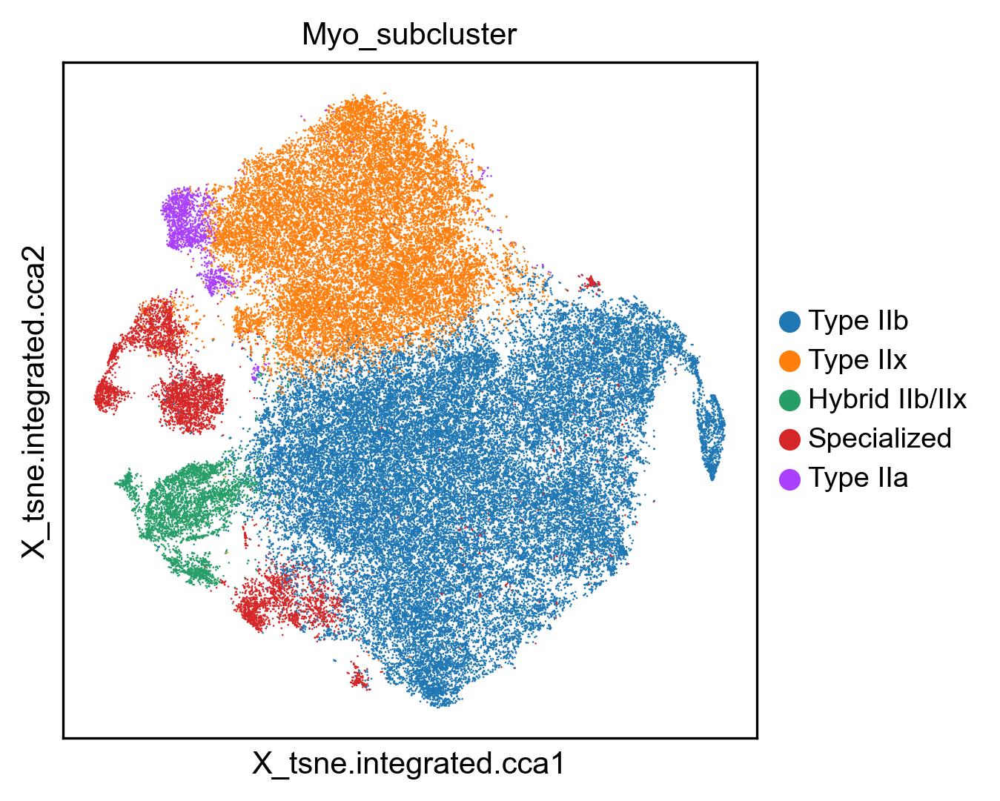

In [30]:
sc.pl.embedding(adata, basis = 'X_tsne.integrated.cca', color='Myo_subcluster')

Concatenate embeddings (tSNE, UMAP, etc.)

In [10]:
umapDF = pd.DataFrame(adata.obsm['X_umap.integrated.cca'], columns=['_X', '_Y'])

Embeddings_X = pd.DataFrame( index=lf.ca.CellID )
Embeddings_X = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap.integrated.cca'],index=adata.obs.index)[0] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[0] ,
        dr_tsne['X'] ,
        dr_umap['X']
    ], sort=False, axis=1, join='outer' )
Embeddings_X.columns = ['1','2','3','4']

Embeddings_Y = pd.DataFrame( index=lf.ca.CellID )
Embeddings_Y = pd.concat( [
        pd.DataFrame(adata.obsm['X_umap.integrated.cca'],index=adata.obs.index)[1] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[1] ,
        dr_tsne['Y'] ,
        dr_umap['Y']
    ], sort=False, axis=1, join='outer' )
Embeddings_Y.columns = ['1','2','3','4']

Metadata:

In [ ]:
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": -1,
        "name": f"Scanpy t-SNE (highly variable genes)"
    },
    {
        "id": 1,
        "name": f"Scanpy UMAP  (highly variable genes)"
    },
    {
        "id": 2,
        "name": "Scanpy PC1/PC2"
    },
    {
        "id": 3,
        "name": "SCENIC AUC t-SNE"
    },
    {
        "id": 4,
        "name": "SCENIC AUC UMAP"
    },
]

metaJson["clusterings"] = [{
            "id": 0,
            "group": "Scanpy",
            "name": "Myo_subcluster",
            "clusters": [],
        }]

metaJson["metrics"] = [
        {
            "name": "nUMI"
        }, {
            "name": "nGene"
        }, {
            "name": "Percent_mito"
        }
]

metaJson["annotations"] = [
    {
        "name": "Myo_subcluster",
        "values": list(set( adata.obs['Myo_subcluster'].astype(str)))
    },
]

# SCENIC regulon thresholds:
metaJson["regulonThresholds"] = rt


for i in adata.obs.Myo_subcluster.cat.categories:
    clustDict = {}
    clustDict['id'] = i
    metaJson['clusterings'][0]['clusters'].append(clustDict)
    
clusterings = pd.DataFrame()
clusterings["0"] = adata.obs['Myo_subcluster'].values

Assemble loom file row and column attributes

In [12]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [177]:
adata.obs.combined

L1_CELL24_N2          KO:Type IIb
L1_CELL33_N1          KO:Type IIx
L1_CELL60_N2          KO:Type IIb
L1_CELL74_N4          KO:Type IIx
L1_CELL95_N2          KO:Type IIb
                        ...      
L12_CELL89690_N1    FLOX:Type IIx
L12_CELL89691_N1    FLOX:Type IIx
L12_CELL89692_N1    FLOX:Type IIx
L12_CELL89693_N1    FLOX:Type IIx
L12_CELL89694_N1    FLOX:Type IIx
Name: combined, Length: 76126, dtype: object

In [13]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
    "nUMI": np.array(adata.obs['nCount_RNA'].values),
    "nGene": np.array(adata.obs['nFeature_RNA'].values),
    "Annotation": np.array( adata.obs['Myo_subcluster'].values ),
    "Combined": np.array(adata.obs['combined'].values),
    "Case_control": np.array(adata.obs['case_control'].values),
    "Sample": np.array(adata.obs['batch'].values),
    "Percent_mito": np.array(adata.obs['percent.mt'].values),
    "Embedding": dfToNamedMatrix(umapDF),
    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
    "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
    # "Clusterings": dfToNamedMatrix(clusterings),
    "ClusterID": np.array(adata.obs['Myo_subcluster'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'mm10',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')

Create a new loom file, copying the expression matrix from the open loom connection:

In [14]:
f_final_loom

'tmem41b_scenic_integrated-output.loom'

In [15]:
lp.create(
    filename = f_final_loom ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file

This loom file can now be imported into [SCope](http://scope.aertslab.org/).

In [217]:
lf.close()

## Result analysis

In [16]:
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
from pyscenic.utils import load_motifs
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
sig = load_signatures('reg.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

## load scenic output

In [24]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [25]:
# create a dictionary of regulons:
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).items():
    regulons[i] =  list(r[r==1].index.values)

In [ ]:
cellAnnot = pd.concat(
    [
        pd.DataFrame( lf.ca.ClusterID, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Annotation, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Case_control, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Sample, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Combined, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.Percent_mito, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nGene, index=lf.ca.CellID ),
        pd.DataFrame( lf.ca.nUMI, index=lf.ca.CellID ),
    ],
    axis=1
)
cellAnnot.columns = [
'ClusterID',
'Annotation',
'Case_control',
'Sample',
'Combined',
'Percent_mito',
'nGene',
'nUMI']

In [27]:
# capture embeddings:
dr = [
    pd.DataFrame( lf.ca.Embedding, index=lf.ca.CellID )
]
dr_names = [
    meta['embeddings'][0]['name'].replace(" ","_")
]

# add other embeddings
drx = pd.DataFrame( lf.ca.Embeddings_X, index=lf.ca.CellID )
dry = pd.DataFrame( lf.ca.Embeddings_Y, index=lf.ca.CellID )

for i in range( len(drx.columns) ):
    dr.append( pd.concat( [ drx.iloc[:,i], dry.iloc[:,i] ], sort=False, axis=1, join='outer' ))
    dr_names.append( meta['embeddings'][i+1]['name'].replace(" ","_").replace('/','-') )

# rename columns:
for i,x in enumerate( dr ):
    x.columns = ['X','Y']

In [28]:
lf.close()

###  Regulon specificity scores (RSS) across predicted cell types

In [72]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

### Calculate RSS 

In [30]:
rss_cellType = regulon_specificity_scores( auc_mtx, cellAnnot['Combined'] )
rss_cellType

,Ahr(+),Alx1(+),Alx4(+),Arid3a(+),Atf3(+),Barhl1(+),Batf(+),Batf3(+),Cdx2(+),Cebpa(+),...,Zfp689(+),Zfp738(+),Zfp78(+),Zfp87(+),Zfp941(+),Zfp953(+),Zfy2(+),Zic3(+),Zkscan14(+),Zscan18(+)
KO:Type IIb,0.441256,0.410392,0.406203,0.405137,0.425870,0.427110,0.396603,0.405648,0.392266,0.432394,...,0.257873,0.328785,0.359990,0.404265,0.219899,0.303481,0.427020,0.440472,0.309626,0.434966
KO:Type IIx,0.318719,0.312050,0.301358,0.301844,0.323522,0.321170,0.297772,0.315343,0.310087,0.320164,...,0.238825,0.275867,0.275894,0.310988,0.213640,0.265062,0.318243,0.322517,0.282950,0.316522
KO:Type IIa,0.185763,0.186117,0.184248,0.184078,0.186617,0.185188,0.183657,0.186138,0.184830,0.185198,...,0.181248,0.182315,0.184233,0.185744,0.176637,0.183263,0.185667,0.185627,0.185747,0.185561
KO:Specialized,0.219454,0.217354,0.213781,0.215195,0.216877,0.218551,0.213193,0.216093,0.213718,0.217522,...,0.197196,0.209831,0.210895,0.216503,0.190118,0.205868,0.217879,0.218873,0.203921,0.218144
KO:Hybrid IIb/IIx,0.209716,0.194692,0.205089,0.196992,0.208845,0.208609,0.198936,0.190897,0.195824,0.196334,...,0.178351,0.179154,0.224142,0.214114,0.184314,0.174749,0.210302,0.203580,0.199267,0.215718
FLOX:Type IIb,0.364604,0.338340,0.341825,0.345459,0.357204,0.364605,0.345406,0.344455,0.356983,0.376605,...,0.233280,0.308332,0.300479,0.340508,0.207303,0.250900,0.361119,0.368468,0.277218,0.364976
FLOX:Type IIx,0.289549,0.274712,0.276559,0.276825,0.308491,0.290471,0.279536,0.286238,0.287686,0.289888,...,0.222864,0.252033,0.256729,0.286416,0.198336,0.222053,0.293237,0.289047,0.258837,0.291619
FLOX:Type IIa,0.182587,0.182081,0.182102,0.181287,0.184537,0.183397,0.181696,0.183114,0.183892,0.182384,...,0.177185,0.180972,0.179715,0.182703,0.174633,0.176830,0.183786,0.182601,0.182896,0.183092
FLOX:Specialized,0.211370,0.208726,0.208413,0.209328,0.211659,0.212706,0.209857,0.209321,0.211240,0.213705,...,0.192193,0.205187,0.202778,0.209153,0.184305,0.192741,0.211401,0.212137,0.198143,0.212067
FLOX:Hybrid IIb/IIx,0.189904,0.182969,0.190294,0.185107,0.190118,0.190436,0.185457,0.182013,0.184264,0.185216,...,0.173759,0.177775,0.196635,0.193597,0.176459,0.172500,0.190080,0.187145,0.186351,0.193064


## RSS panel plot with all cell types

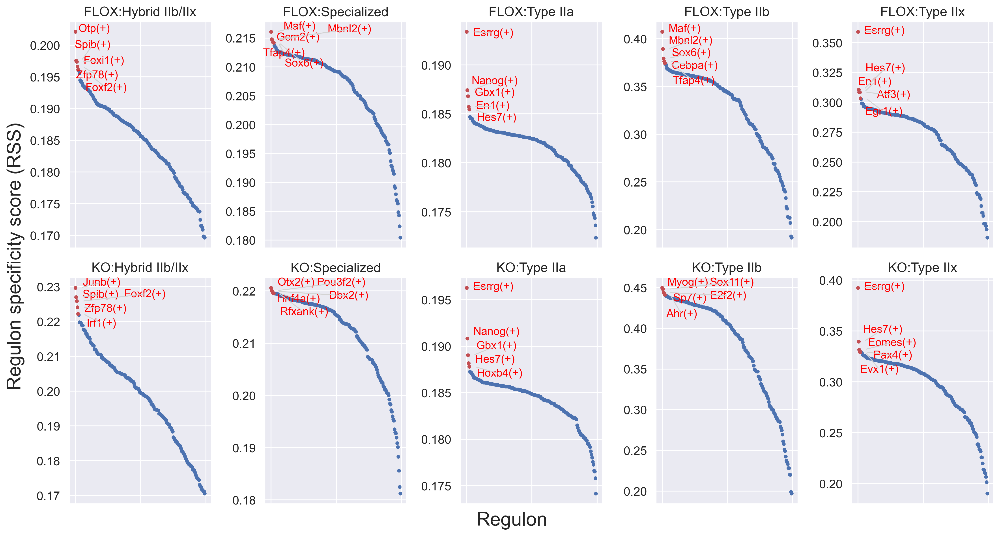

In [185]:
cats = sorted(list(set(cellAnnot['Combined'])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("tmem41b_subMyo-RSS-top5.png", dpi=600, bbox_inches = "tight")
plt.show()

### Select the top 5 regulons from each cell type

In [325]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:1].index)
    )
topreg = list(set(topreg))

#### Generate a Z-score for each regulon to enable comparison between regulons

In [ ]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

#### Generate a heatmap

In [97]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [99]:
cats

['FLOX:Hybrid IIb/IIx',
 'FLOX:Specialized',
 'FLOX:Type IIa',
 'FLOX:Type IIb',
 'FLOX:Type IIx',
 'KO:Hybrid IIb/IIx',
 'KO:Specialized',
 'KO:Type IIa',
 'KO:Type IIb',
 'KO:Type IIx']

In [100]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in cellAnnot['Combined'] ]

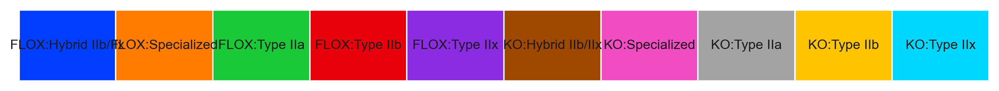

In [101]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
# plt.savefig("PBMC10k_cellType-heatmap-legend-top5.pdf", dpi=600, bbox_inches = "tight")

In [108]:
auc_mtx_Z

,Ahr(+),Alx1(+),Alx4(+),Arid3a(+),Atf3(+),Barhl1(+),Batf(+),Batf3(+),Cdx2(+),Cebpa(+),...,Zfp689(+),Zfp738(+),Zfp78(+),Zfp87(+),Zfp941(+),Zfp953(+),Zfy2(+),Zic3(+),Zkscan14(+),Zscan18(+)
L1_CELL24_N2,-0.567291,1.670900,-0.311400,3.893779,1.734517,-1.369278,-1.066273,1.550924,1.208777,0.758040,...,-0.371032,0.313851,0.714436,-1.101699,-0.243436,-0.489328,-1.132072,0.360330,-0.641217,-1.305148
L1_CELL33_N1,0.794567,-0.395072,0.378638,-1.021318,0.882079,0.276798,-1.009231,1.636818,0.617845,0.179819,...,-0.371032,2.200256,1.124401,1.706336,-0.243436,-0.489328,0.870482,0.949290,-0.641217,-0.624900
L1_CELL60_N2,0.824338,-0.297323,0.358206,-0.029262,0.353685,-1.070572,3.177229,0.133842,2.212321,1.058243,...,-0.371032,0.989347,-0.669884,-0.739123,-0.243436,-0.489328,0.583681,1.571640,0.746205,0.599547
L1_CELL74_N4,0.948384,1.659217,0.286983,-0.260087,1.911427,-1.172055,-1.066273,1.239600,0.157971,1.254450,...,-0.371032,-0.696362,1.054542,-0.865859,-0.243436,-0.489328,-0.909566,0.107775,-0.641217,-0.841068
L1_CELL95_N2,3.536477,1.790847,-0.049863,0.619995,0.609416,-0.012973,0.962785,2.324297,0.643990,1.116655,...,-0.371032,0.859366,1.345929,-1.101699,-0.243436,-0.489328,1.627581,2.192233,1.887593,-1.223518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
L12_CELL89690_N1,0.755203,-0.190617,-0.869503,-0.902958,-0.250319,1.881387,1.460373,0.203939,0.237410,-2.113826,...,2.523900,-0.696362,-0.501670,-0.439364,-0.243436,-0.489328,-0.627822,-0.092813,0.958382,-0.256054
L12_CELL89691_N1,-0.497495,-1.041151,-0.800616,0.258042,0.654957,-0.565707,-0.806529,-0.437138,-0.556979,-1.254294,...,-0.371032,0.919979,-0.392285,-0.307118,-0.243436,-0.489328,-0.541853,-1.030982,-0.641217,-0.076166
L12_CELL89692_N1,0.169707,-1.053224,-0.818713,2.603615,0.530303,-0.604641,1.585152,1.022069,1.954899,-0.516612,...,-0.371032,-0.696362,-0.422618,-0.341281,-0.243436,-0.489328,2.748780,-1.059853,-0.641217,-0.121516
L12_CELL89693_N1,0.382735,-0.116234,-0.794194,0.318940,-0.685296,-0.545921,-0.796343,-0.427923,-1.311816,-0.792550,...,-0.371032,0.847244,-0.384012,-0.294995,-0.243436,-0.489328,-0.530295,-1.601616,1.157767,-0.053491


In [ ]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')

### Generate a binary regulon activity matrix:

In [74]:
binary_mtx, auc_thresholds = binarize( auc_mtx, num_workers=25 )
binary_mtx.head()

,Ahr(+),Alx1(+),Alx4(+),Arid3a(+),Atf3(+),Barhl1(+),Batf(+),Batf3(+),Cdx2(+),Cebpa(+),...,Zfp689(+),Zfp738(+),Zfp78(+),Zfp87(+),Zfp941(+),Zfp953(+),Zfy2(+),Zic3(+),Zkscan14(+),Zscan18(+)
L1_CELL24_N2,0,1,1,1,1,0,0,1,1,0,...,0,1,1,0,0,0,0,0,0,0
L1_CELL33_N1,1,0,1,0,1,1,0,1,1,0,...,0,1,1,1,0,0,1,1,0,0
L1_CELL60_N2,1,0,1,0,1,0,1,0,1,1,...,0,1,0,0,0,0,1,1,1,0
L1_CELL74_N4,1,1,1,0,1,0,0,1,1,1,...,0,0,1,0,0,0,0,0,0,0
L1_CELL95_N2,1,1,1,0,1,1,1,1,1,1,...,0,1,1,0,0,0,1,1,1,0


In [190]:
cell_type_key = 'Myo_subcluster'
cell_type_color_lut = dict(zip(adata.obs[cell_type_key].dtype.categories, adata.uns[f'{cell_type_key}_colors']))
cell_id2cell_type_lut = adata.obs[cell_type_key].to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

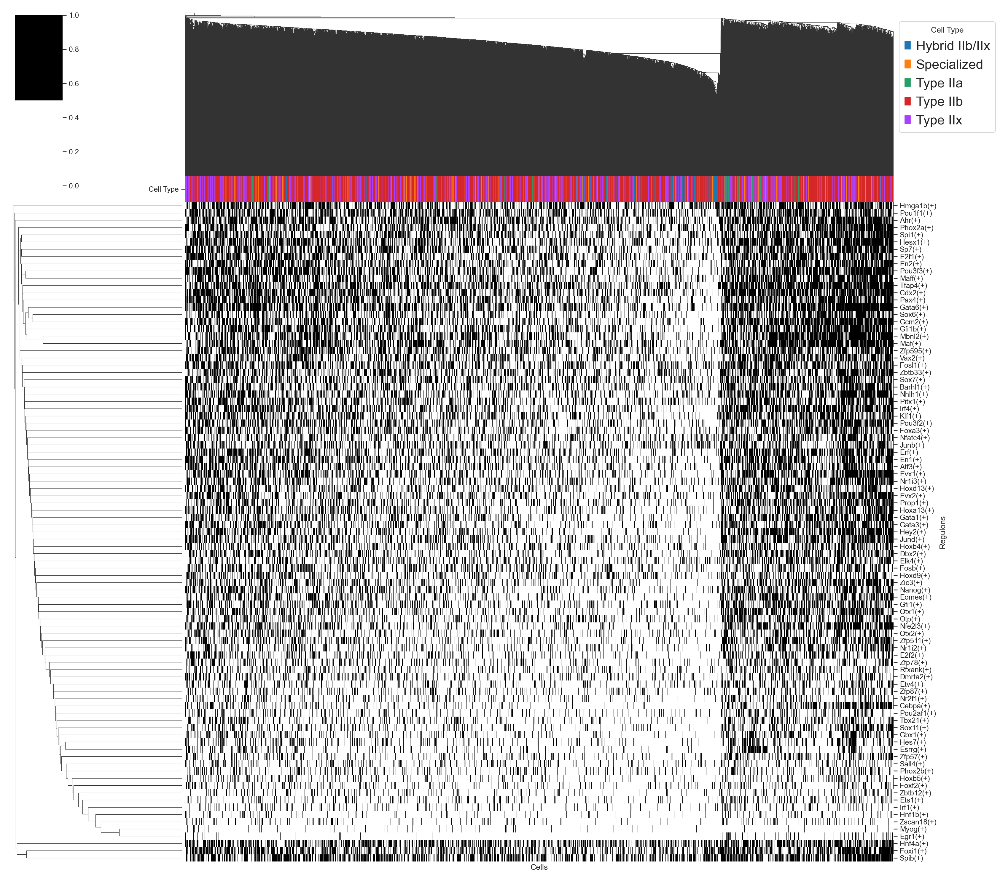

In [365]:
from matplotlib.patches import Patch

sns.set()
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})
g = sns.clustermap(
    data=trans, 
    col_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
    cmap=bw_palette, figsize=(20,20),col_cluster=True,row_cluster=True,
    )
handles = [Patch(facecolor=color) for color in cell_type_color_lut.values()]
plt.legend(handles, cell_type_color_lut.keys(), title='Cell Type', 
           bbox_to_anchor=(1.06, 0.98), bbox_transform=plt.gcf().transFigure, 
           loc='upper right',prop = {'size':20})

g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])

g.cax.set_visible(True)
# plt.show()
plt.savefig("cellType-heatmap-binary-top20.png", dpi=300, bbox_inches = "tight")

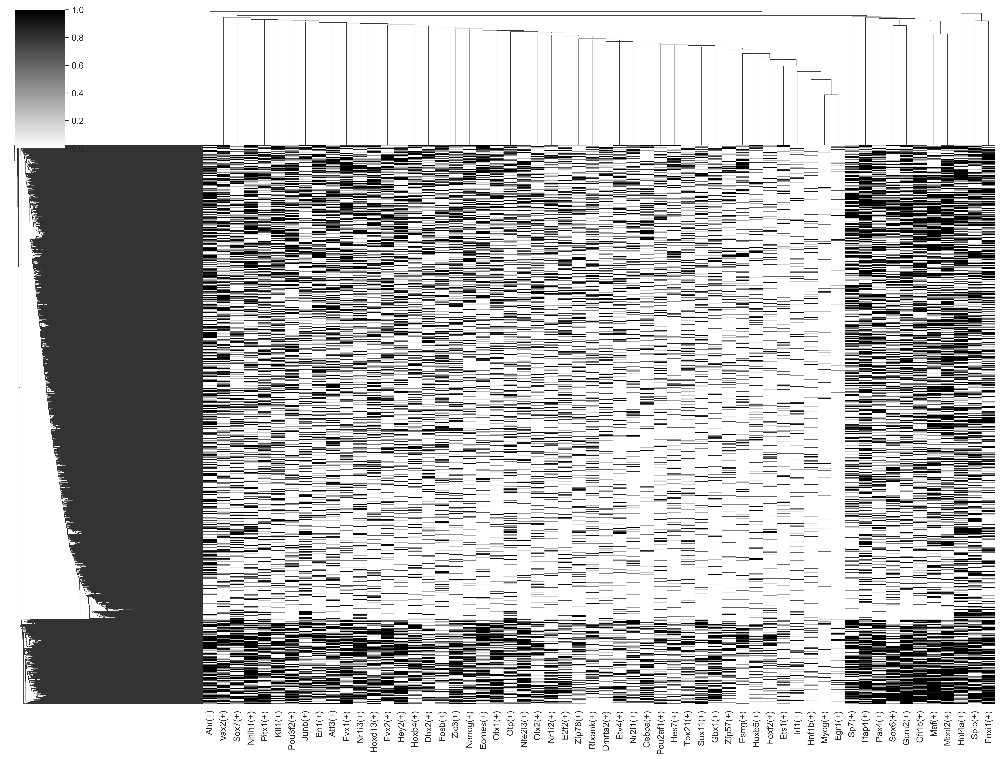

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1.2)

g = sns.clustermap(binary_mtx[topreg], 
                   annot=False, 
                   square=False, 
                   linecolor='gray',
                   yticklabels=False, 
                   xticklabels=True, 
                   vmin=0, vmax=1,  
                   cmap='binary',  
                   figsize=(21, 16),
                   method='average')  

g.cax.set_visible(True)

g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')

plt.show()

## Create pseudo-bulk heatmap

In [144]:
trans = grouped_means[topreg].T

In [ ]:
sorted_labels_text = [
                     'FLOX:Type IIa',
                     'KO:Type IIa',
                     'FLOX:Type IIb',
                     'KO:Type IIb',
                     'FLOX:Type IIx',
                     'KO:Type IIx',
                     'FLOX:Hybrid IIb/IIx',
                     'KO:Hybrid IIb/IIx',
                     'FLOX:Specialized',
                     'KO:Specialized'
                    ]

trans = trans[sorted_labels_text]

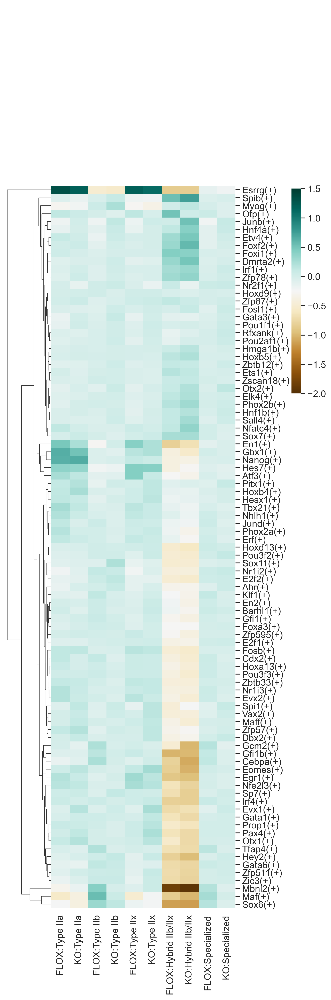

In [ ]:
sns.set(font_scale=1.2)
g = sns.clustermap(trans, annot=False,  square=False,  linecolor='gray',
    yticklabels=True, xticklabels=True, vmin=-2, vmax=1.5, col_cluster=False,
    cmap='BrBG', figsize=(6,20) )
g.cax.set_visible(True)

cbar_len = 0.2  
cbar_pos = [0.97, 0.61, 0.03, cbar_len]  

g.cax.set_position(cbar_pos)

plt.setp(g.ax_heatmap.xaxis.get_majorticklabels(), rotation=90)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("cellType-heatmap-top20.png", dpi=300, bbox_inches = "tight")

### Show the AUC distributions for selected regulons

/tmp/ipykernel_3983233/1731492361.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
/tmp/ipykernel_3983233/1731492361.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
/tmp/ipykernel_3983233/1

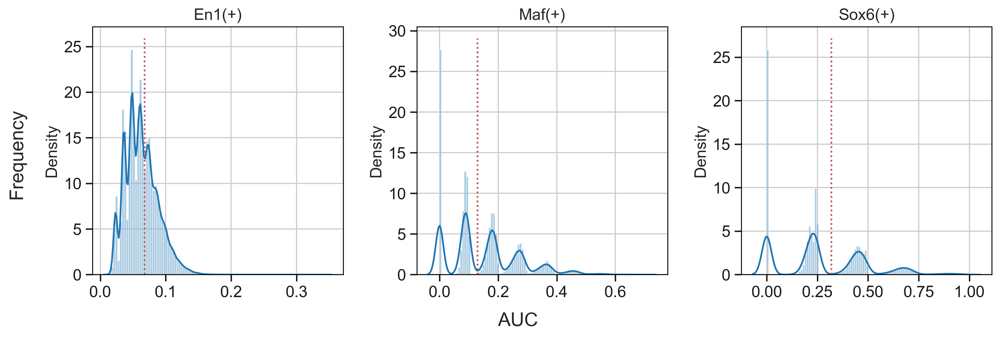

In [ ]:
# select regulons:
r = [ 'En1(+)', 'Maf(+)', 'Sox6(+)' ]

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')
    
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='large')
fig.text(0.5, -0.01, 'AUC', ha='center', va='center', rotation='horizontal', size='large')

fig.tight_layout()

/home/daibaojun/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/daibaojun/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


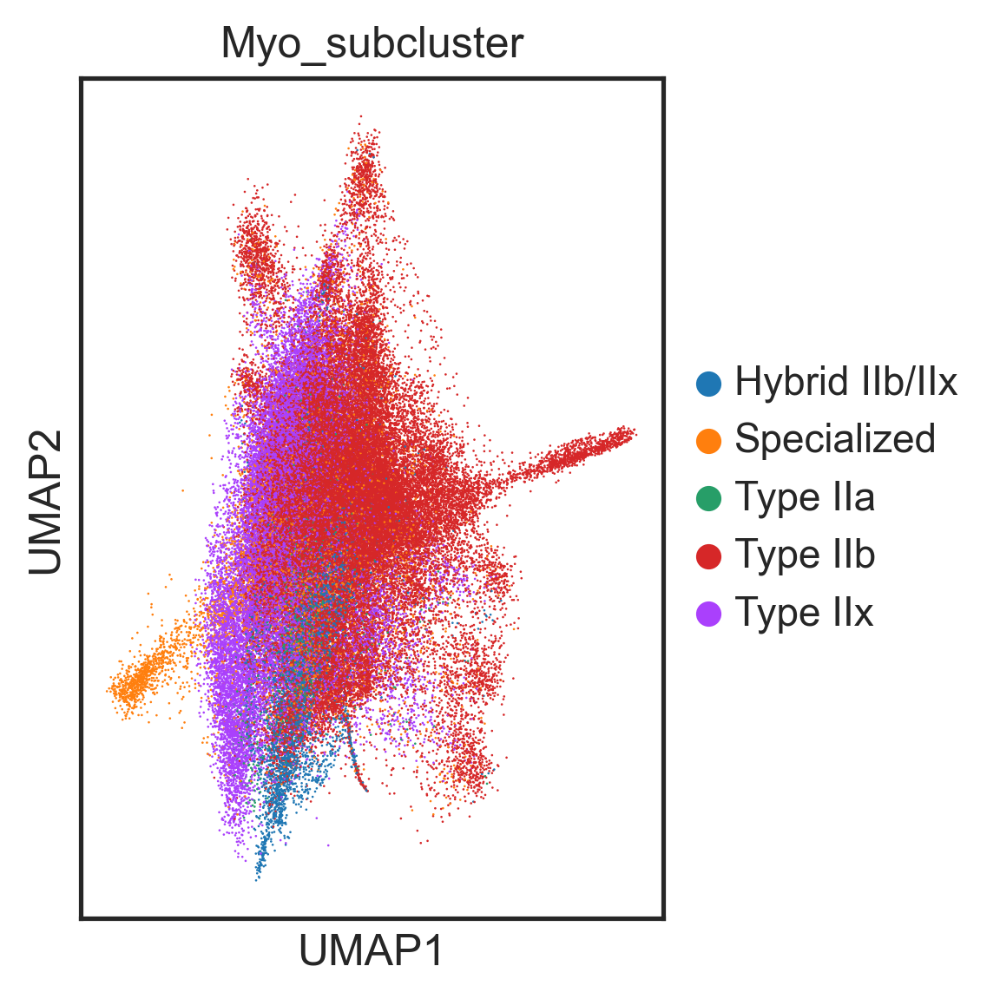

In [200]:
sc.pp.neighbors(adata)
sc.tl.umap(adata,init_pos="X_aucell",neighbors_key = '')
sc.pl.umap(adata,color=cell_type_key)

/home/daibaojun/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


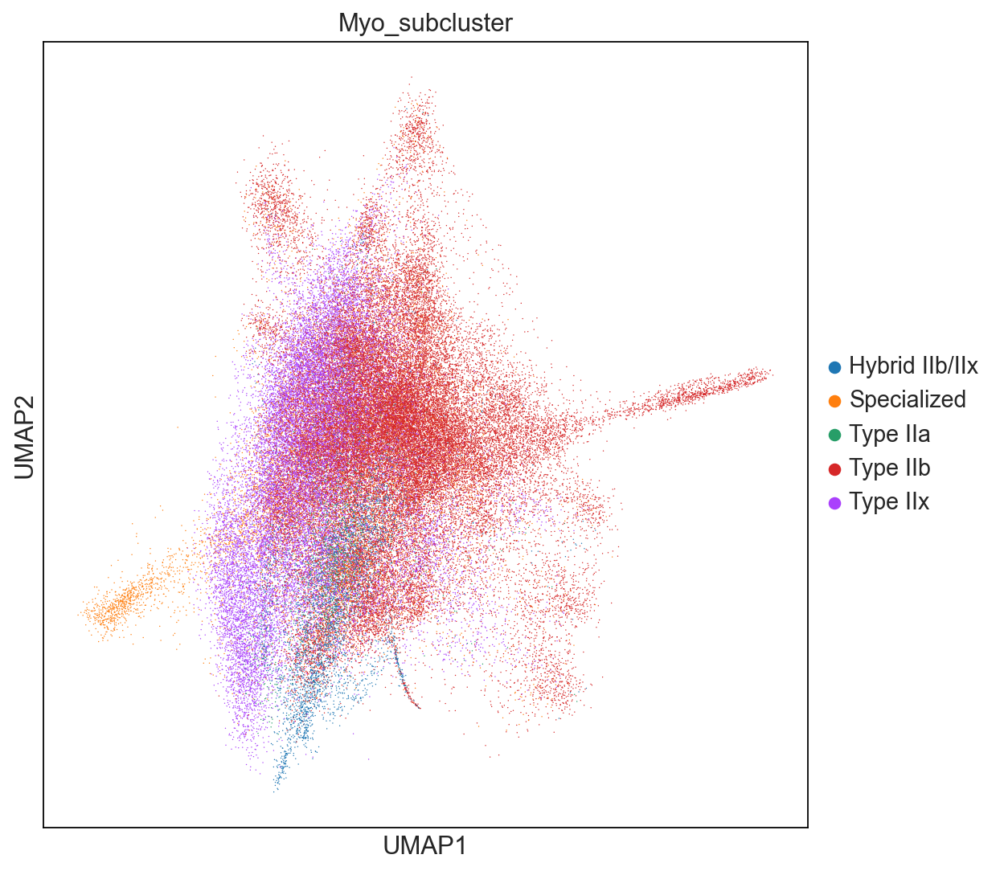

<Figure size 640x560 with 0 Axes>

In [300]:
sc.set_figure_params(figsize=[8,7])
sc.pl.umap(adata,color=cell_type_key)

/home/daibaojun/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


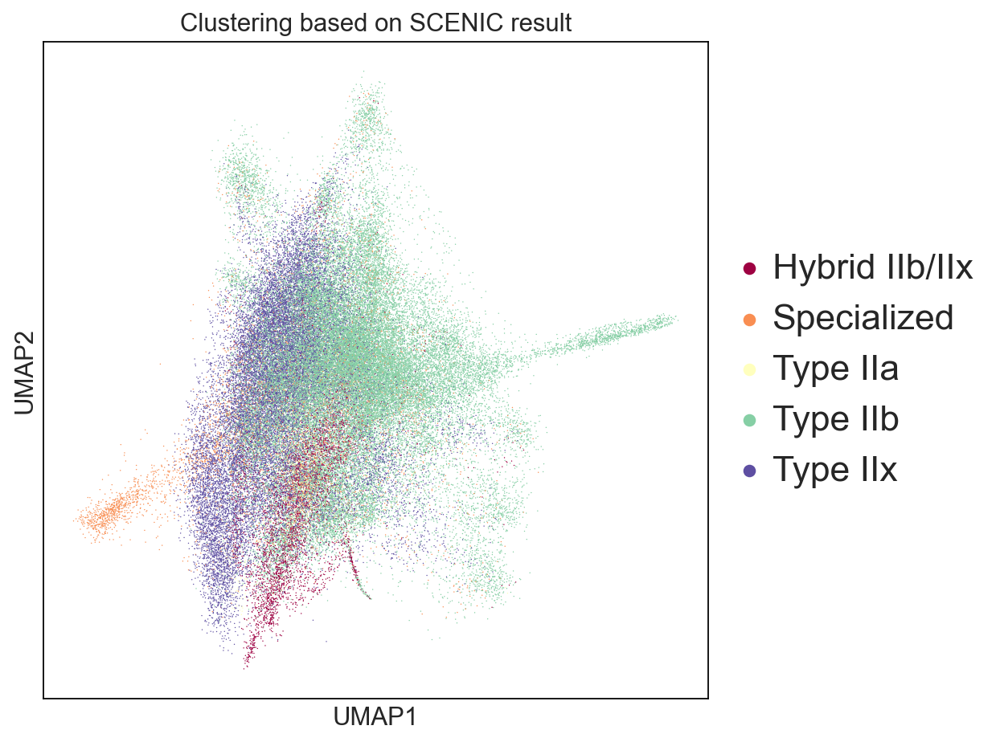

In [ ]:
sc.set_figure_params(figsize=[8,6])
sc.pl.umap(adata, color = cell_type_key, palette='Spectral', title='Clustering based on SCENIC result', frameon=True,legend_fontsize=20, legend_fontweight='medium',legend_fontoutline=2,save = '_plot.png')

## print top reg in each cluster

In [327]:
topreg

['Junb(+)', 'Otp(+)', 'Esrrg(+)', 'Maf(+)', 'Myog(+)', 'Otx2(+)']

In [328]:
modified_list = ['Regulon({})'.format(item) for item in topreg]
modified_list

['Regulon(Junb(+))',
 'Regulon(Otp(+))',
 'Regulon(Esrrg(+))',
 'Regulon(Maf(+))',
 'Regulon(Myog(+))',
 'Regulon(Otx2(+))']

In [333]:
test = [ 'En1(+)', 'Maf(+)', 'Sox6(+)' ]
modified_list = ['Regulon({})'.format(item) for item in test]
modified_list

['Regulon(En1(+))', 'Regulon(Maf(+))', 'Regulon(Sox6(+))']

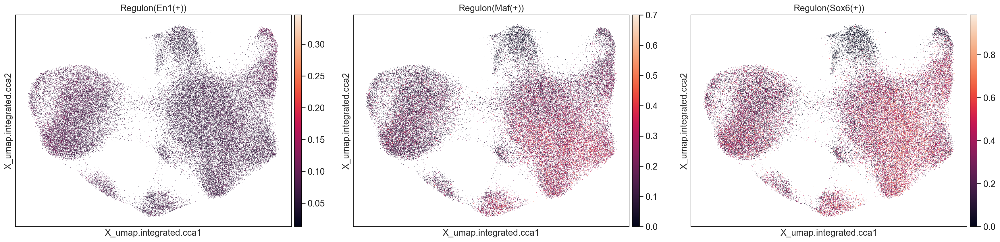

In [334]:
sc.pl.embedding(adata, basis = 'X_umap.integrated.cca',color = modified_list,ncols=3,save = '_others.png')